# Seminar 1 - A Song of Graphs and Search

---

**Course**: Graphs and Network Analysis

**Degree**: Artificial Intelligence Degree (UAB)

**Topic**: Practical seminar that includes exercises from units 1 to 6

**Activity description**: Most of us are familiar with the Game of Thrones books or series. For those who do not know it, it is a fictional series from the HBO chain, inspired by the series of novels "A Song of Ice and Fire", which tells the experiences of a group of characters from different noble houses on the fictional continent of *Westeros* to have control of the Iron Throne and rule the seven kingdoms that make up the territory. The series' success has spawned many blogs and other sources about the series, with additional resources. The graphs that we propose to use in this exercise represent the characters of the series (or books) as nodes, and their co-appearance in a scene (the weights of the edges are higher if two characters appear simultaneously more times). So we have a social network of characters. We will use these graphs to work on some of the concepts seen in the first units of the course (graph and node metrics, search and routes). Finally, synthetic graphs that simulate a realistic network will be generated.

## Qualification

**Submission**: An '.ipynb' file from the colab corresponding to each group will be delivered (this very same file, adding the code blocks and explanations that correspond to each activity). To get the file you will need to go to File --> Download. Remember that you will have to answer and analyze the different problems. Coding alone will NOT be evaluated: explaining and reasoning about the solution of the problem is essential. **You should provide explanations of the obtained results for at least the exercises marked with the 💬 symbol**. 
The outcome of this seminar will thus be an analysis of the network at different levels: global metrics, node importance, shortest paths, random graphs, and visualization. 

**Delivery form**: The work must be done in groups of two people and delivered through the virtual campus (in the section corresponding to Seminar 1).

**Doubts**: For any questions, apart from class sessions, you can contact cristina.perez@uab.cat.

**Deadline**: March 15 (during all day).

**Marks**: The grade of the seminars (seminar 1 + seminar 2) has a weight of 10% on the final grade of the subject.


## 1. Environment setup
----

The main libraries that will be used in this seminar are the following:

* [NetworkX](https://networkx.github.io/)
* [Pandas](https://pandas.pydata.org/)
* [Matplotlib](https://matplotlib.org/)
* [NumPy](https://numpy.org/)



In [79]:
!pip install --upgrade scipy networkx

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [80]:
!apt install libgraphviz-dev
!pip install pygraphviz

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libgraphviz-dev is already the newest version (2.42.2-3build2).
0 upgraded, 0 newly installed, 0 to remove and 22 not upgraded.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [81]:
import networkx as nx
from networkx.drawing.nx_agraph import graphviz_layout

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from collections import Counter

## 2. Data collection

---

This seminar is based on data from *Game of Thrones* and "A Song of Ice and Fire" curated by Andrew Beveridge. Data is available from two different github repositories:

* [Book to Network](https://github.com/mathbeveridge/asoiaf)
* [Script to Network](https://github.com/mathbeveridge/gameofthrones)

In each of them, there is a *data* folder with several *.csv* files that encode nodes and edges of different networks.

To download the data in the *colab* environment you can run the following command:

```
$ !wget https://raw.githubusercontent.com/mathbeveridge/repo_name/master/data/file_id-nodes.csv
$ !wget https://raw.githubusercontent.com/mathbeveridge/repo_name/master/data/file_id-edges.csv
```


where,

* **repo_name** is the name of the repository, *asoiaf* for the Books and *gameofthrones* for the Script.
* **file_id** is the ID of the file you can find with the link. This indicates the book or season number.

For example, to download the graph of the first season of the series, we would run:

```
$ !wget https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s1-nodes.csv
$ !wget https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s1-edges.csv
```

The downloaded files can be found in */content/file_name*.

For this activity, we will work with the graph generated from all the books. 


*  **Download the two .csv files corresponding to the graph generated from all the books (asoiaf-all)**.

In [82]:
!wget https://raw.githubusercontent.com/mathbeveridge/asoiaf/master/data/asoiaf-all-edges.csv
!wget https://raw.githubusercontent.com/mathbeveridge/asoiaf/master/data/asoiaf-all-nodes.csv

--2023-03-15 18:54:24--  https://raw.githubusercontent.com/mathbeveridge/asoiaf/master/data/asoiaf-all-edges.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122588 (120K) [text/plain]
Saving to: ‘asoiaf-all-edges.csv.2’

asoiaf-all-edges.cs 100%[===================>] 119.71K  --.-KB/s    in 0.01s   

2023-03-15 18:54:24 (9.13 MB/s) - ‘asoiaf-all-edges.csv.2’ saved [122588/122588]

--2023-03-15 18:54:24--  https://raw.githubusercontent.com/mathbeveridge/asoiaf/master/data/asoiaf-all-nodes.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 20

## 3. Data load

---

The function *csv_to_graph()* creates a NetworkX graph from the *.csv* files encoding edges and nodes.

In [83]:
def csv_to_graph(file_id_nodes: str, file_id_edges: str, origin: str = 'book') \
                    -> nx.graph:
    """Return a nx.graph
    
    Build a graph given a csv file for nodes and edge.
    origin controls the source of the graph to adapt the node features.
    """
    
    if origin == 'book':
        key1, key2 = 'weight', 'book'
    elif origin == 'script':
        key1, key2 = 'Weight', 'Season'
    else:
        raise NameError('Unknown origin {}'.format(origin))
        
    nodes = pd.read_csv(file_id_nodes)
    edges = pd.read_csv(file_id_edges)

    if key2 not in edges:
        key2 = 'id'
        
    g = nx.Graph()
    for row in nodes.iterrows():
        g.add_node(row[1]['Id'], name=row[1]['Label'])

    for row in edges.iterrows():
        g.add_edge(row[1]['Source'],row[1]['Target'], 
                   weight=1/row[1][key1], id=row[1][key2])

    return g


In [84]:
a = csv_to_graph("asoiaf-all-nodes.csv","asoiaf-all-edges.csv")

* **Create a NetworkX graph from the downloaded files using the `csv_to_graph` function.** [Optionally, you can repeat the process with the graph generated from the series]

In [85]:
g_book = csv_to_graph("asoiaf-all-nodes.csv","asoiaf-all-edges.csv", origin="book")

* **Generate a first exploratory visualization of the graph.**

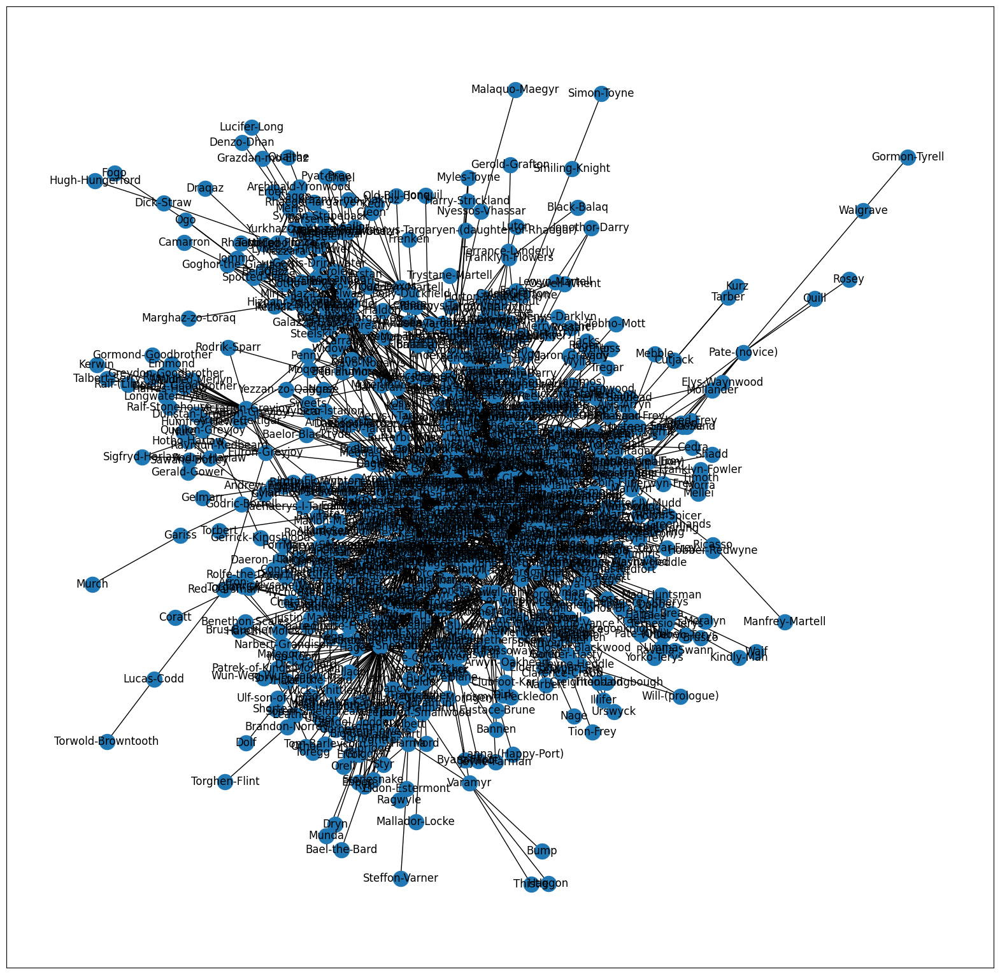

In [86]:
plt.rcParams['figure.figsize'] = [20, 20]
plt.rcParams['figure.dpi'] = 100
nx.draw_networkx(g_book)

## 4. General graph metrics
---

Perform a general summary of the Network properties.

* **💬  Obtain the order, size and density of the graph, as well as the average degree of its nodes.**


In [87]:
print(f"The order of the graph is: {g_book.order()}")
print(f"The size of the graph is : {g_book.size()}")
print(f"The density of the graph is: {nx.density(g_book)}")

degree= 0
for key,value in g_book.degree():
  degree+=value
print(f"The average degree of the graph is: {degree/len(g_book)}")

The order of the graph is: 796
The size of the graph is : 2823
The density of the graph is: 0.008921968332227173
The average degree of the graph is: 7.092964824120603


##💬 : 
**Order:** The order of a graph is the number of nodes the graph has. In this case is the number of characters that appear in the books.

**Size:**  The size of a graph is the number of edges the graph has. In this case is co-appearance of the characters in a scene.

**Density:** 
The density of a graph is the degree of sparseness of the graph. The density of an undirected graph is given by the equation 2 * E / V (V - 1).
Note that the number of maximum edges in a graph is V (V - 1) / 2. In this case, that is (796 * 795) / 2 = 316410.0 maximum edges that the graph can have. So we can see that of the total number of possible edges we only have 2823, which is the reason that gives us that lower value in the density as the numerator is lower compare to the denominator.

**Average degree:** The average degree is the average number of edges each node has. In this case, it would be the average number of co-appearance characters each character has. So, with how many people a character appears in different scenes.



* **Check that it is a connected undirected graph.**

In [88]:
print("""The graph is connected: {first}
The graph is undirected: {second}""".format(first=nx.is_connected(g_book),second=not(nx.is_directed(g_book))))

The graph is connected: True
The graph is undirected: True


* **💬 Make a small report on the metrics of the given graph (diameter, radius, average network distance, clustering coefficient).**

In [89]:
print(f"The diameter is: {nx.diameter(g_book):2d}")
print(f"The radius is:   {nx.radius(g_book):2d}")
print(f"The clustering coefficient is:   {round(nx.average_clustering(g_book), 2)}")
print(f"The average network distance is: {round(nx.average_shortest_path_length(g_book), 2)}")

The diameter is:  9
The radius is:    5
The clustering coefficient is:   0.49
The average network distance is: 3.42


##💬 :
The **diameter** of a graph represents the longest distance between any two vertices in the graph, or in other words, the maximum eccentricity of any vertex. On the other hand, the **radius** is the shortest distance from any vertex to the farthest vertex in the graph. In this network, the diameter is 9 units, which indicates that there exist two nodes that are separated by 9 edges, while the radius is 5, as there are two nodes that are 5 edges apart. 

The **average network distance** is approximately 3.5, which means that most node pairs are separated by about 3 edges. 

Additionally, a **clustering coefficient** of 0.5 suggests that around half of the possible triangles in the network exist, indicating a moderate level of local clustering or transitivity.

Based on these metrics, it can be inferred that there exist highly connected nodes that function as bridges between the less important characters in the series. These vertices might correspond to the most important characters in the storyline.

## 5. Centrality metrics: Characters' importance
---


In this section, we will study the importance of the characters according to their centrality in the graph.

* **Compute the 10 most central nodes in the network taking into account the different types of centrality (degree, betweenness, closeness and eigenvector centrality). Moreover, use page rank to assess importance of the characters.**

  * *centrality_bar_plot()*: Given the corresponding centrality draw a bar graph.
  * 💬 Try to reason about the changes that occur with the different types of centrality.

In [90]:
def centrality_bar_plot(centrality, name='betweenness', n=10):
    
    centrality_value = sorted(centrality.items(), key=lambda item: item[1], reverse = True)[:n]
    values = [value [1] for value in centrality_value]
    label  = [value[0] for value in centrality_value]
    
    df = pd.DataFrame({'Name': label, name: values})
    ax = df.plot.bar(x='Name', y=name, rot=90)

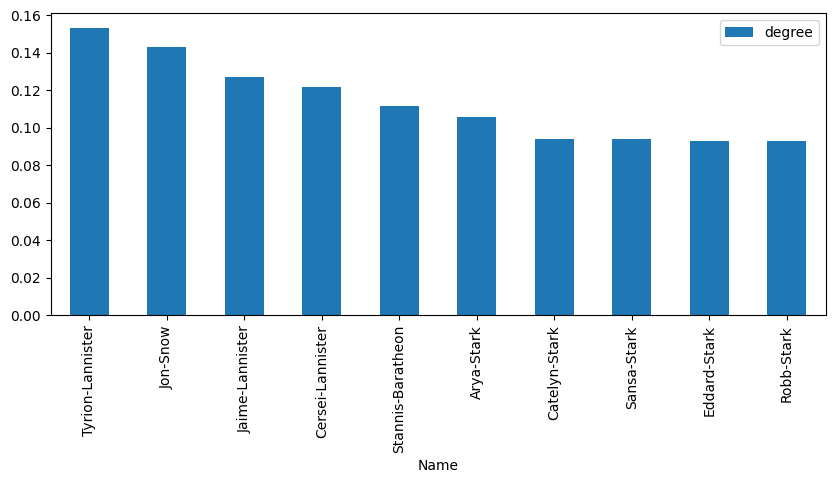

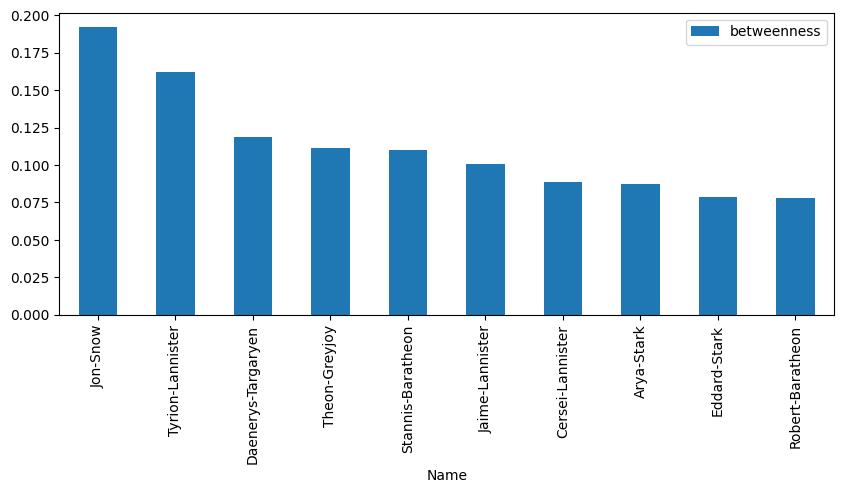

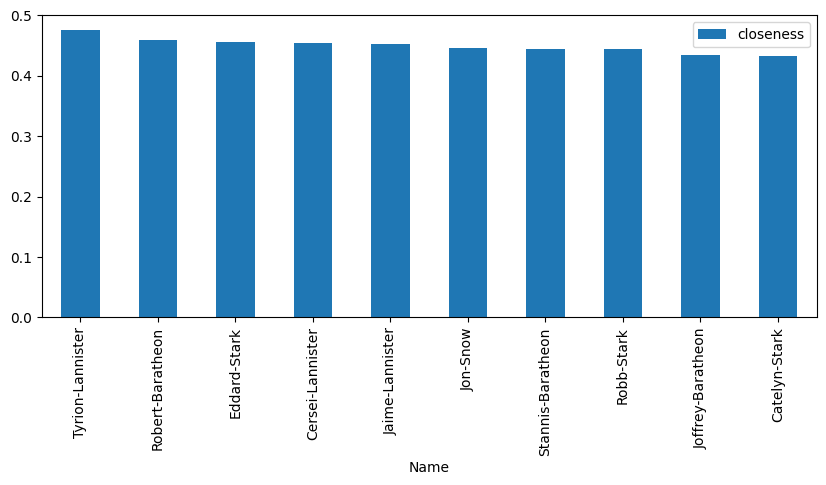

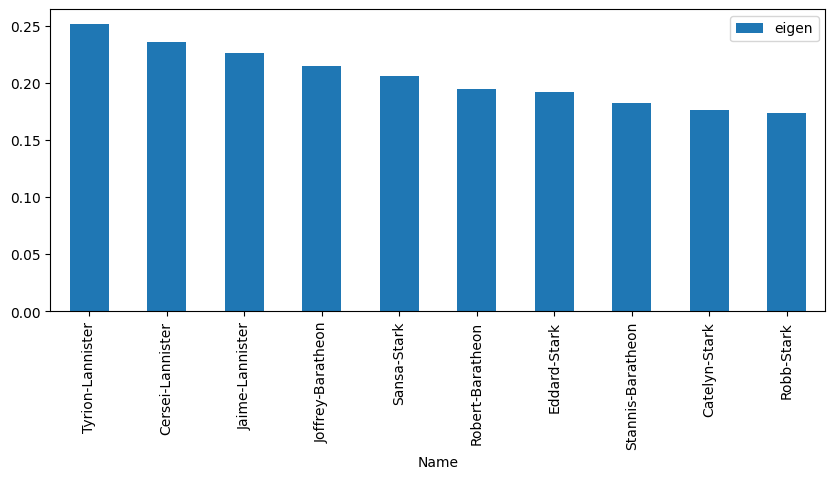

In [91]:
plt.rcParams['figure.figsize'] = [10, 4]

degree_centrality = nx.degree_centrality(g_book)
betweenness_centrality = nx.betweenness_centrality(g_book)
closeness_centrality = nx.closeness_centrality(g_book)
eigen_centrality = nx.eigenvector_centrality(g_book)


centrality_bar_plot(degree_centrality, name='degree')
centrality_bar_plot(betweenness_centrality, name='betweenness')
centrality_bar_plot(closeness_centrality, name='closeness')
centrality_bar_plot(eigen_centrality, name='eigen')

plt.rcParams['figure.figsize'] = [12, 12]

In [92]:
page_rank = sorted(nx.pagerank(g_book).items(), key=lambda item: item[1], reverse=True)[:10]
print(f"The page rank is:{page_rank}")

The page rank is:[('Jon-Snow', 0.01512641861426675), ('Jaime-Lannister', 0.01361785505171803), ('Tyrion-Lannister', 0.012645504669064948), ('Stannis-Baratheon', 0.012525017354769736), ('Theon-Greyjoy', 0.01148701666574283), ('Cersei-Lannister', 0.010708219188528208), ('Daenerys-Targaryen', 0.010646598590330944), ('Arya-Stark', 0.010510035815971057), ('Eddard-Stark', 0.009588736026139393), ('Robb-Stark', 0.009379048470069106)]


##💬 :
We see that the most important nodes in the network are the nodes corresponding to **Jhon Snow** and **Tyrion-Lannister**.

These nodes have the highest values in all of the following metrics - degree, betweenness, closeness, eigenvector centrality, and PageRank. These nodes are very important in the network. They have many connections to other nodes, and are also bridges between different parts of the network. They are also highly centrally located and well-connected to other nodes, making them important hubs in the network.

The fact that these nodes have high PageRank scores also indicates that they are likely to be highly visible and influential in the network. In the context of a web graph, for example, these nodes might correspond to popular and highly linked web pages that are frequently visited and referenced by other pages.

Overall, nodes with high values in all of these centrality metrics are likely to be key players in the network, with significant influence over the flow of information or resources within the system.

* **What is the subgraph generated by the best connected characters?**
  * Use closeness centrality to generate the graph of the 25 most central characters.

In [93]:
"""
closeness_centrality = nx.closeness_centrality(g_book)
sorted_nodes = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:25]
summ = 0
G = nx.Graph()
for node in range(len(sorted_nodes)):
  for node2 in range(node + 1, len(sorted_nodes)):
    if (g_book.has_edge(sorted_nodes[node], sorted_nodes[node2])):
      G.add_edge(sorted_nodes[node], sorted_nodes[node2])
nx.draw(G, pos=pos,with_labels = True)
"""

'\ncloseness_centrality = nx.closeness_centrality(g_book)\nsorted_nodes = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:25]\nsumm = 0\nG = nx.Graph()\nfor node in range(len(sorted_nodes)):\n  for node2 in range(node + 1, len(sorted_nodes)):\n    if (g_book.has_edge(sorted_nodes[node], sorted_nodes[node2])):\n      G.add_edge(sorted_nodes[node], sorted_nodes[node2])\nnx.draw(G, pos=pos,with_labels = True)\n'

In [94]:
def centrality_subgraph(g, closeness_centrality, name='closeness', n=25):
  # sort nodes based on their degree centrality scores
  sorted_nodes = sorted(closeness_centrality, key=closeness_centrality.get, reverse=True)[:n]
  # create a new subgraph containing only these 25 nodes and their edges
  subgraph = g_book.subgraph(sorted_nodes)
  pos = nx.spring_layout(subgraph)
  return subgraph, pos

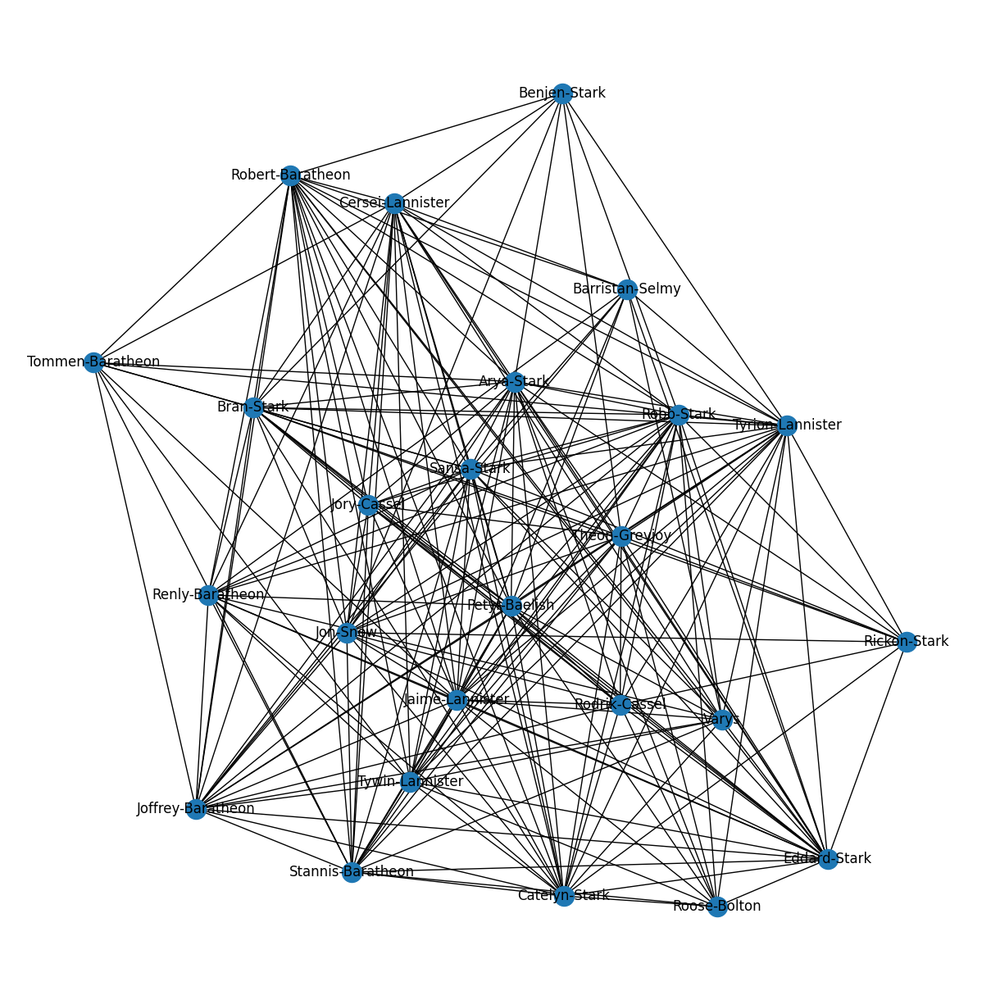

In [95]:
closeness_centrality = nx.closeness_centrality(g_book)
g_subgraph, pos = centrality_subgraph(g_book,closeness_centrality)
nx.draw(g_subgraph, pos=pos, with_labels=True)

* **Draw this subgraph where the nodes are of size proportional to their centrality. Mark the most central and the less central node in the graph (for instance, use the color of the node to highlight it).**
  * Use *closeness centrality* and scale it appropriately to emphasize the importance of different nodes.

In [96]:
closeness_centrality = nx.closeness_centrality(g_book)
top_close = dict(sorted(closeness_centrality.items(), key=lambda item: item[1], reverse=True)[:25])

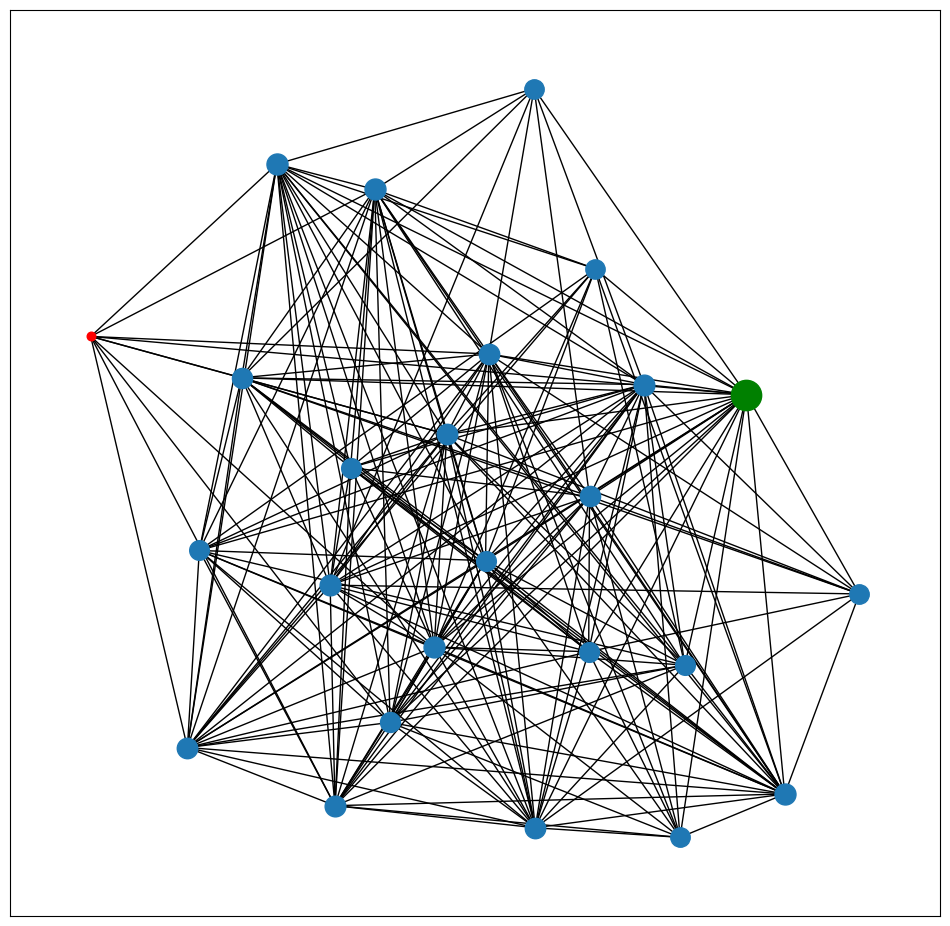

In [97]:
for i in top_close:
  if i == "Tyrion-Lannister":
      nx.draw_networkx_nodes(g_subgraph,pos=pos, nodelist=[i], node_size=1000*(top_close[i]), node_color = "g")
  elif i == "Tommen-Baratheon":
      nx.draw_networkx_nodes(g_subgraph,pos=pos, nodelist=[i], node_size=100*(top_close[i]), node_color = "r")
  else:
      nx.draw_networkx_nodes(g_subgraph,pos=pos, nodelist=[i], node_size=500*(top_close[i]))
nx.draw_networkx_edges(g_subgraph,pos=pos)


* **Draw the tree that the BFS and DFS algorithm would generate to traverse the graph starting from the least central node of the network according to *closeness centrality*.**
  * Use *closeness centrality* and scale it appropriately to emphasize the importance of different nodes.
  * To get the positions of the nodes, you can use the `graphviz_layout(tree, prog='dot')` command.
  * 💬 Comment on the obtained result.


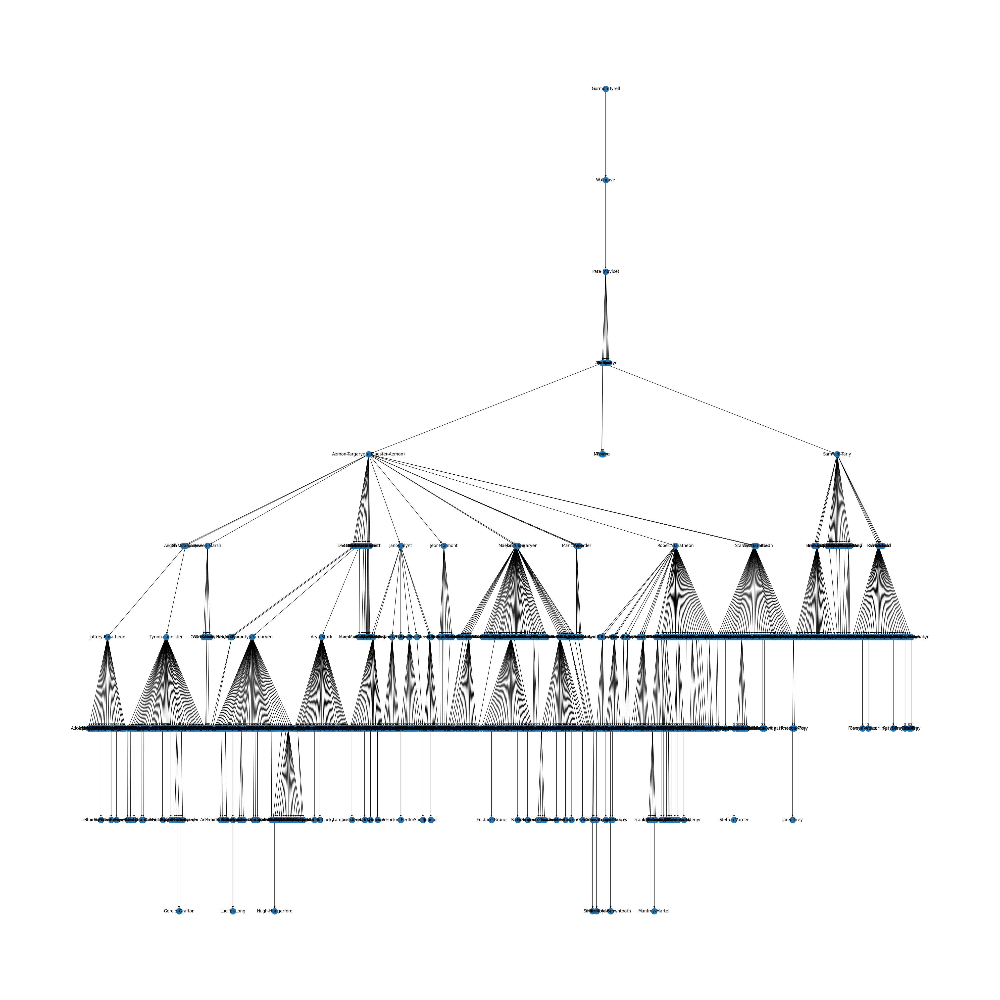

In [98]:
plt.figure(figsize = [40, 40])
# calculate the closeness centrality of each node
cc = nx.closeness_centrality(g_book)

# find the node with the lowest closeness centrality
least_central_node_id = min(cc, key=cc.get)

# create a BFS tree starting from the least central node
bfs_tree = nx.bfs_tree(g_book, source=least_central_node_id)
pos = graphviz_layout(bfs_tree, prog='dot')
nx.draw(bfs_tree, pos, with_labels=True)
plt.show()

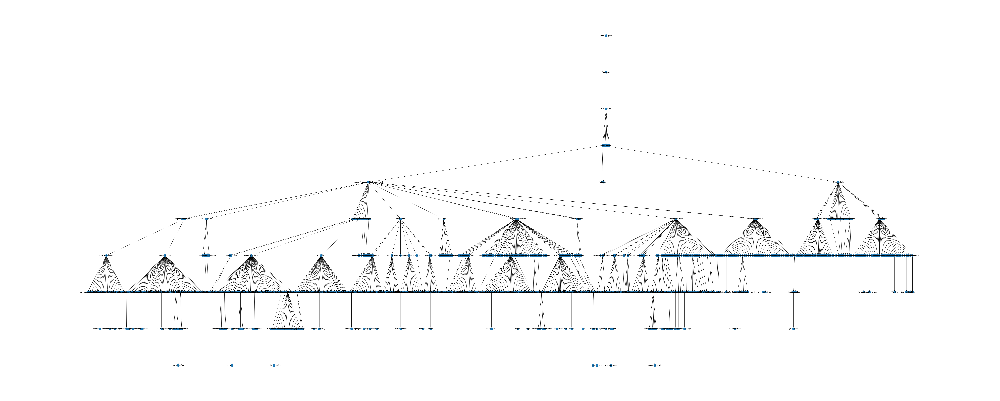

In [99]:
plt.figure(figsize = [100, 40])
# create a DFS tree starting from the least central node
dfs_tree = nx.dfs_tree(g_book, source=least_central_node_id)

pos = graphviz_layout(bfs_tree, prog='dot')
nx.draw(bfs_tree, pos, with_labels=True)
plt.show()

💬 :

As we can see in the obtained results, the way of searching the whole graph has varied. In the **BFS** we can see that it explores the graph going layer by layer, visiting all the neighbors before going into the next layer, so it would visit all the characters that have appeared in a scene with the root, and then the following layer until having searched all the tree. In the other hand, **DFS** is following a path as deep as possible, so it would be visiting only 1 character that has appeared with the root in a scene and move to it, and then 1 character that has appeared with the following and so on, until reaching a character that acts as a leaf. As we can see BFS is better structured and easier to understand the co-ocurrences between characters, as DFS is acting very messy.

* **💬 Compute the shortest path between the least and the most central nodes in the complete graph.**

In [100]:
max(closeness_centrality, key=closeness_centrality.get)

'Tyrion-Lannister'

In [101]:
most_central_node_id  = max(closeness_centrality, key=closeness_centrality.get)
least_central_node_id = min(closeness_centrality, key=closeness_centrality.get)
geodesic_path = nx.shortest_path(g_book, least_central_node_id, most_central_node_id, method="dijkstra")

print(f"The path from {least_central_node_id} to {most_central_node_id}")
for x in geodesic_path:
  print(x, end = " ==> " if x != geodesic_path[-1] else "\n")

print(f"\nThe number of nodes traverse are: {nx.shortest_path_length(g_book, least_central_node_id, most_central_node_id)}")
print(f"An the average of the path is:    {round(nx.average_shortest_path_length(g_book), 2)}")

The path from Gormon-Tyrell to Tyrion-Lannister
Gormon-Tyrell ==> Walgrave ==> Pate-(novice) ==> Alleras ==> Aemon-Targaryen-(Maester-Aemon) ==> Alliser-Thorne ==> Tyrion-Lannister

The number of nodes traverse are: 6
An the average of the path is:    3.42


💬 :

As we can see, the shortest path between the least and most central nodes is only of size 6, that is because the most central node **(Tyron-Lannister)** is highly connected, and is used as a "bridge" between many other nodes, making it very easy to go from any node to the most central one.

## 6. Random graph models
----
Up to this point, we have worked with a graph generated from the data extracted from the *Song of Ice and Fire* books. In the real world, however, obtaining the data needed to construct this graph can become very complex and expensive. This is one of the reasons why, over time, the synthetic generation of graphs has been studied.

In this section we will work on the different models described in class. We will generate random graphs and study their properties.

* **Generate random graphs with the Uniform, Gilbert and Barabási-Albert models. Fix the number of nodes to the order of the studied graph. Adjust the rest of the parameters of the graph generation function to obtain graphs with similar number of edges.**

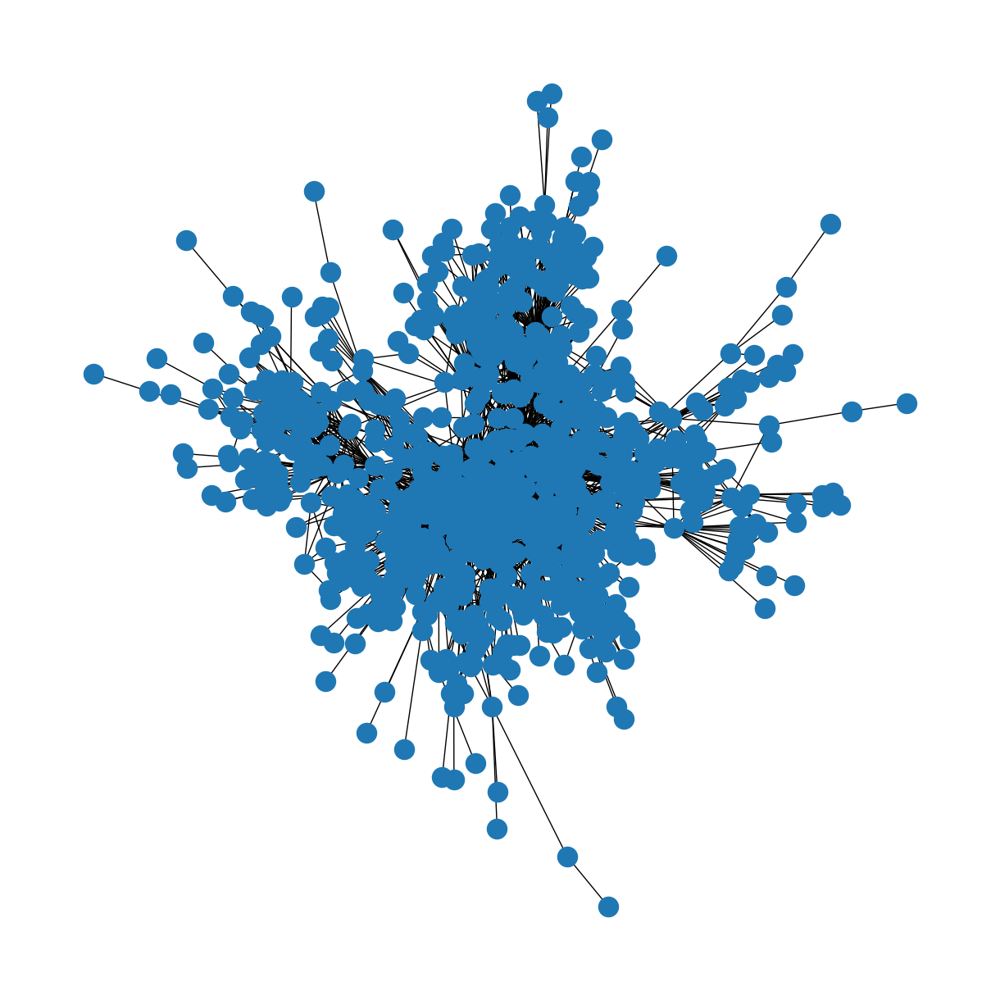

In [102]:
nx.draw(g_book)

### Erdös-Rény: Uniform Model (gnm)

In [103]:
edges = len(g_book.edges)
nodes = len(g_book.nodes)

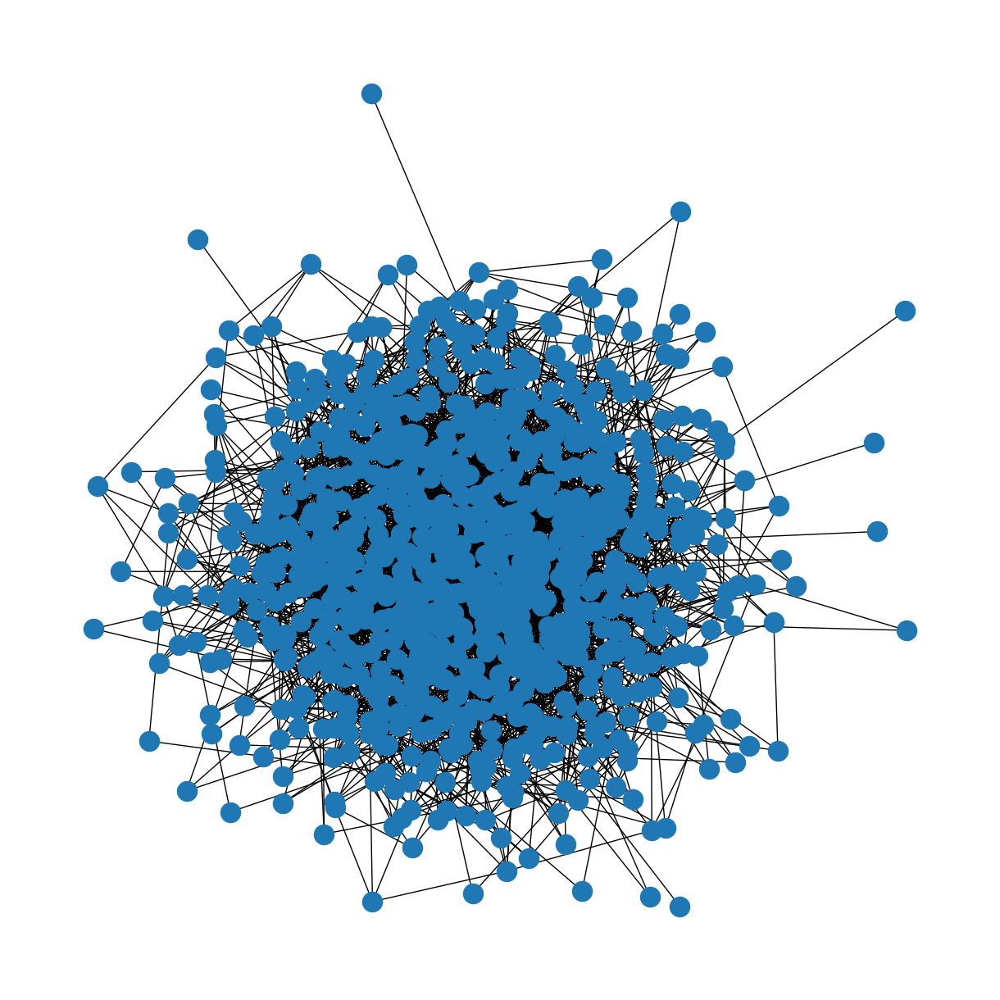

In [104]:
g_uniform = nx.gnm_random_graph(nodes,  edges, seed=1, directed=False)
nx.draw(g_uniform)

### Erdös-Rény: Gilbert Model (gnp)


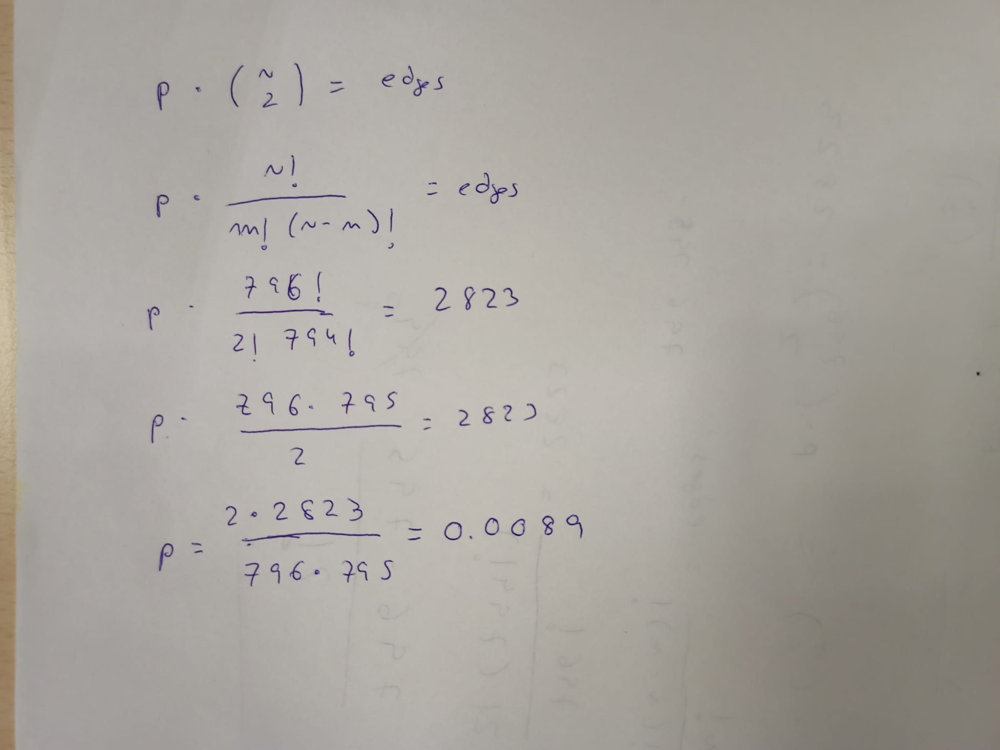

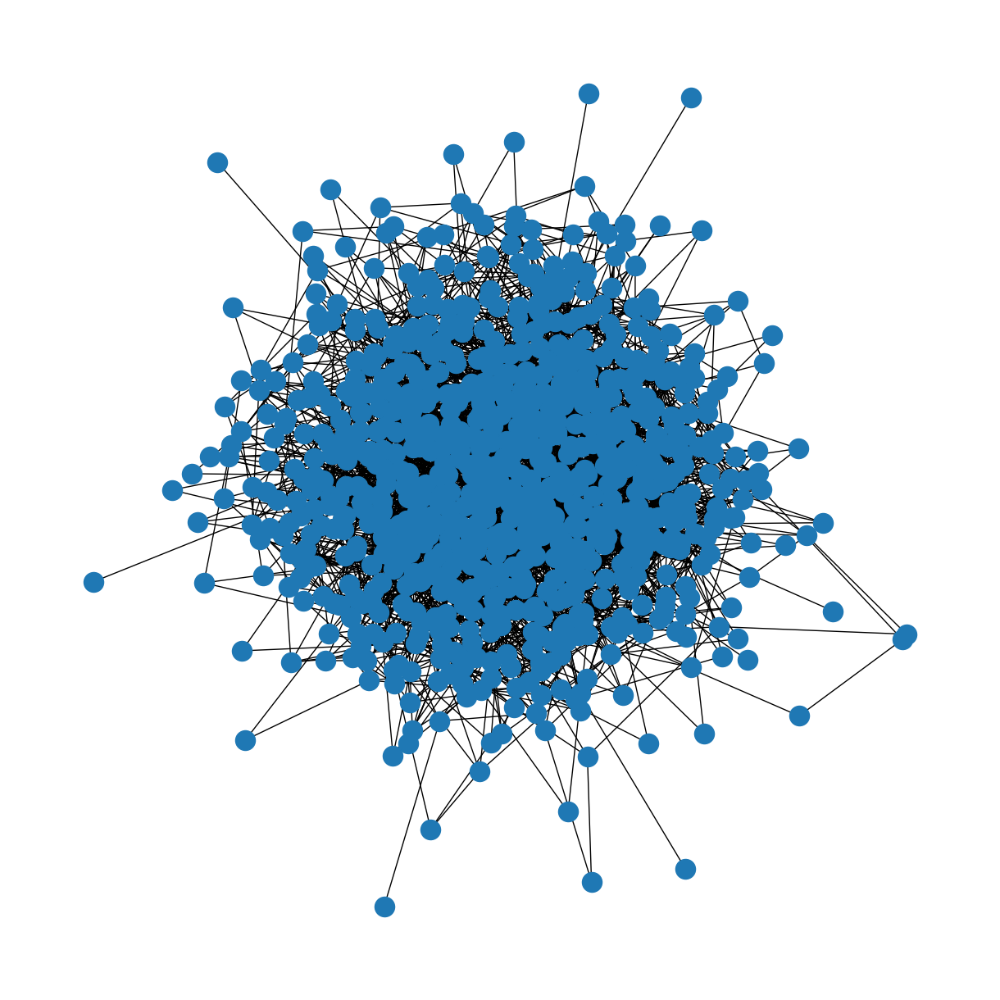

In [105]:
g_gilbert = nx.gnp_random_graph(n=nodes, p=0.0089, seed=1)
nx.draw(g_gilbert)

### Barabási-Albert Model



In [106]:
m = int(edges/nodes)

We want to know the amount of edges that have to be created in each iteration in the Barabasi Albert Model. In order to make the amount of edges similiar to the g_book network, we can campute the ratio of edges per node.

int(round(edges/nodes, 2)) 

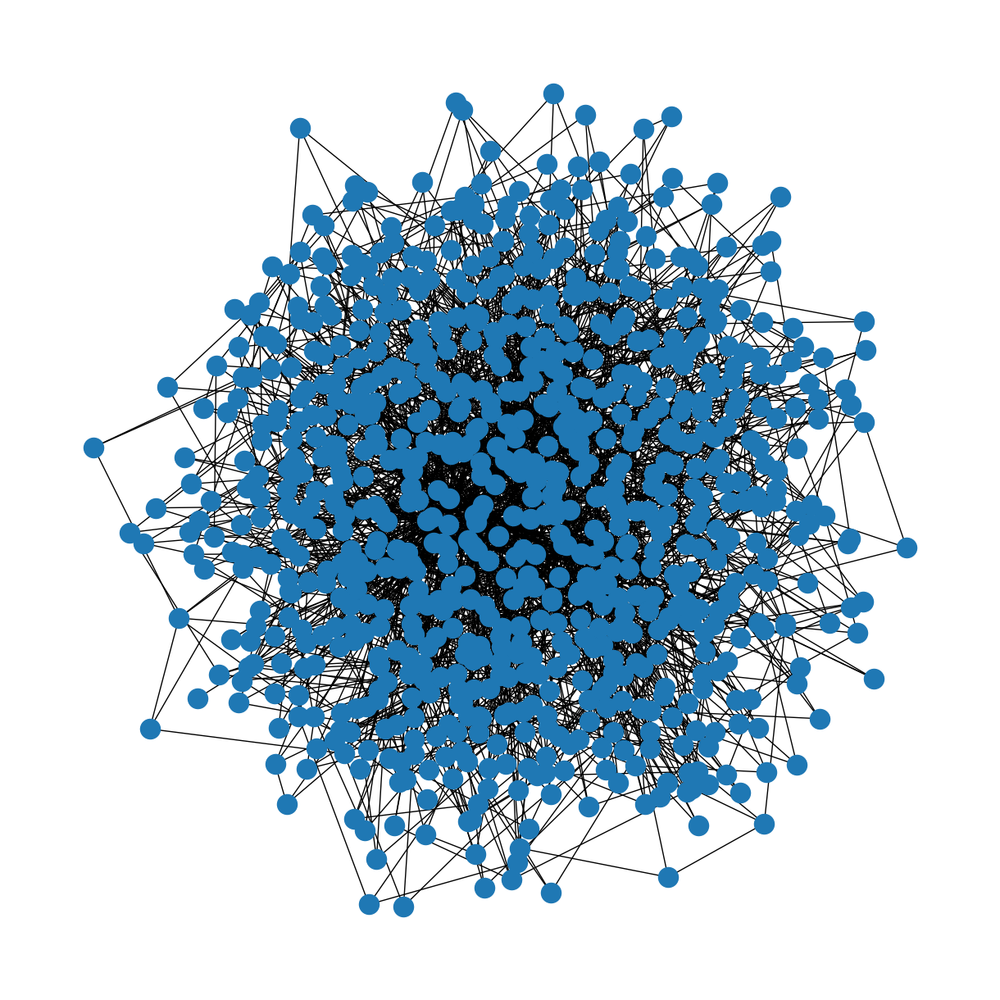

In [107]:
g_barbasi = nx.barabasi_albert_graph(nodes, m, seed=1)
nx.draw(g_barbasi)

In [108]:
g_dict = {'Book': g_book, 'Uniform': g_uniform, 'Erdos': g_gilbert, 'Barbasi': g_barbasi}

* **💬 Show the order and size of the graph as well as the average degree and clustering coefficient of its nodes. Compute also the intervals between the maximum and minimum centralities for each family of synthetic graphs. Make a small report of the main metrics. Which random graph resembles more closely the graph from the books?**
     * You can set the graph generation using a random seed. This way, two different runs will generate exactly the same graph.

In [112]:
for key, graph in g_dict.items():
  print(f"{'-'*len(key)} Graph => {key} {'-'*len(key)}\n")
  print(f"The order of {key} is: {graph.order()}")
  print(f"The size of {key} is: {graph.size()}")
  degree= 0

  for _,value in graph.degree():
    degree+=value

  print(f"The average degree of {key} is: {round(degree/len(graph), 2)}")
  print(f"The clustering coefficient of {key} is: {round(nx.average_clustering(graph), 2)}\n")
  
  Centralities_dict = {"Degree":nx.degree_centrality(graph), 
                      "Betweeness": nx.betweenness_centrality(graph), 
                      "Closeness": nx.closeness_centrality(graph), 
                      "Eigenvector":nx.eigenvector_centrality(graph)}

  for key_centrality, value in Centralities_dict.items():
    least_central_node_id, value_min = (min(value, key=value.get), value[min(value, key=value.get)])
    most_central_node_id , value_max = (max(value, key=value.get), value[max(value, key=value.get)])
    diff = round(value_max - value_min, 2)
    print(f"For the {key} graph we have that the minimum {key_centrality} centrality is {round(value_min, 2)}\
    \nand the maximum {key_centrality} centrality is: {round(value_max, 2)} and their difference is equal to: {diff}\n")


---- Graph => Book ----

The order of Book is: 796
The size of Book is: 2823
The average degree of Book is: 7.09
The clustering coefficient of Book is: 0.49

For the Book graph we have that the minimum Degree centrality is 0.0    
and the maximum Degree centrality is: 0.15 and their difference is equal to: 0.15

For the Book graph we have that the minimum Betweeness centrality is 0.0    
and the maximum Betweeness centrality is: 0.19 and their difference is equal to: 0.19

For the Book graph we have that the minimum Closeness centrality is 0.15    
and the maximum Closeness centrality is: 0.48 and their difference is equal to: 0.33

For the Book graph we have that the minimum Eigenvector centrality is 0.0    
and the maximum Eigenvector centrality is: 0.25 and their difference is equal to: 0.25

------- Graph => Uniform -------

The order of Uniform is: 796
The size of Uniform is: 2823
The average degree of Uniform is: 7.09
The clustering coefficient of Uniform is: 0.01

For the Unifor

💬 :

We can see that the **order** of all the graphs is the same, as it is the number of nodes, and it has to be the same amount for all the different graphs.

The **size** does not vary from the intial to the unifrom, as we have to set the number of nodes and edges, and it generates all possible combinations of graphs and take one of them. But in the Erdos and Barbasi models we can see that contains less edges. In the Erdos model is because it generates a degree distribution that follows a binomial distribution, so it depends on a probability. In the Barbasi model as we add edges in every iteration, depending on the amount of edges that we create in every iteration determine the amount of total edges, so if we set up the parameter we will obtain more edges. For instance, just by changing the m from 3 to 4, we already obtain more than 3000 edges.

The **average degree** as it depends on the amount of edges, it is lower in the Erdos and Barbasi models, as they contain less edges.

The **clustering coefficient**, we can see that when using any model that is not the original, the clustering coefficient decays very much, meaning that the graphs are more sparsely connected and less likely to form communities, which corresponds to a more random or disorganized graph.

The **Interval of centrality** is pretty different between different models, but we can see that lots of them have a minimum centrality of 0, meaning that the nodes are not very relevant in the graph, as they don't contribute in any shortest path, or some of them even are not even connected to the graph.

Finally, we can conclude that the graph that resembles the most to the original is the **barbasi**, as despite not having a similar amount of edges or degree centrality, for the different centralities is the one that has the more similar values.

* **💬 Check whether the networks (the three randomly generated ones and the network extracted from the books) follow a Power Law.**

In [110]:
!pip install powerlaw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


---- Graph => Book ----

Calculating best minimal value for power law fit


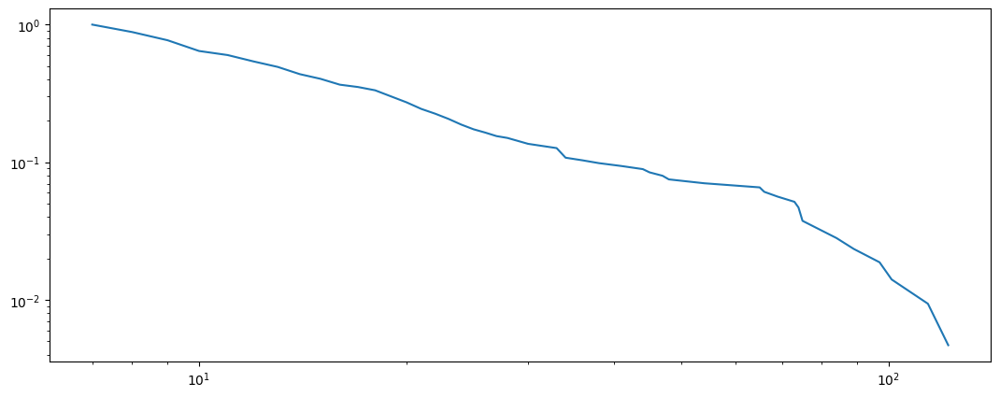

Comparison to lognormal
Log likelihood ratio: -0.9446639339585774
p-value: 0.362853898560623
Comparison to exponential
Log likelihood ratio: 31.571215006341575
p-value: 0.000799556629691276
Comparison to lognormal_positive
Log likelihood ratio: -0.4741679608065681
p-value: 0.7984683128302151
Comparison to stretched_exponential
Log likelihood ratio: -1.098760258845838
p-value: 0.36550269591494866
Comparison to truncated_power_law


Assuming nested distributions


Log likelihood ratio: -1.8978831237322722
p-value: 0.05138235008806202
------- Graph => Uniform -------

Calculating best minimal value for power law fit


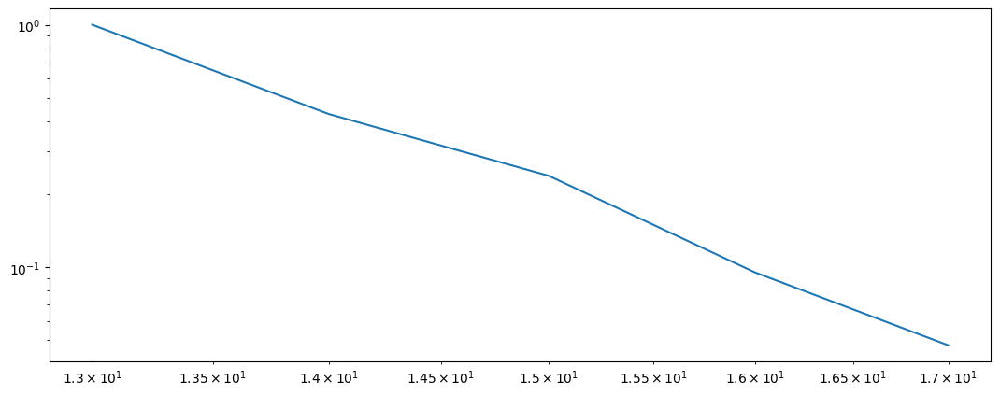

Comparison to lognormal
Log likelihood ratio: -0.22814952509990238
p-value: 0.03255937294036353
Comparison to exponential
Log likelihood ratio: 0.5745118065014789
p-value: 0.08387916677206235
Comparison to lognormal_positive
Log likelihood ratio: 0.20241295307703622
p-value: 0.09690366227371164
Comparison to stretched_exponential
Log likelihood ratio: 0.24050719310773805
p-value: 0.04918774456110911
Comparison to truncated_power_law


/usr/local/lib/python3.9/dist-packages/powerlaw.py:1615: RuntimeWarning: invalid value encountered in true_divide
  CDF = CDF/norm
'nan' in fit cumulative distribution values.
Likely underflow or overflow error: the optimal fit for this distribution gives values that are so extreme that we lack the numerical precision to calculate them.
Assuming nested distributions


Log likelihood ratio: 1.2386214276460805e-09
p-value: 0.9999602877628264
----- Graph => Erdos -----

Calculating best minimal value for power law fit


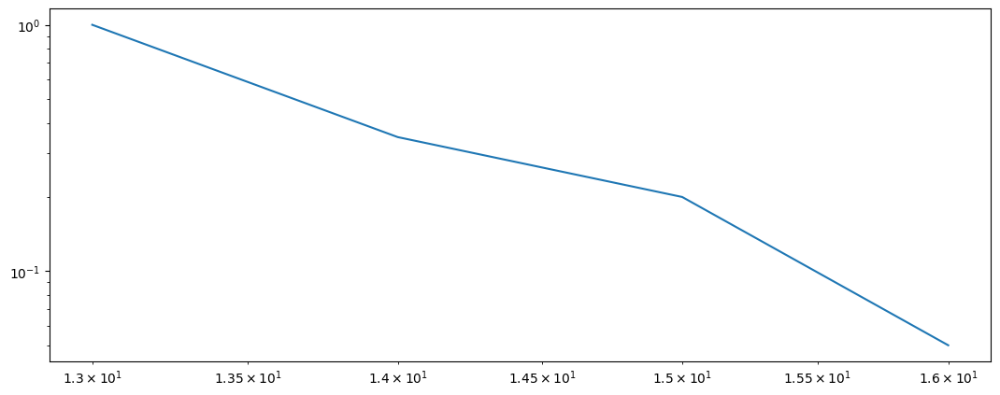

Comparison to lognormal
Log likelihood ratio: -0.030558092083904254
p-value: 0.2867473483742605
Comparison to exponential
Log likelihood ratio: 0.5734192584636226
p-value: 0.038240472208555594
Comparison to lognormal_positive
Log likelihood ratio: 0.20862481673509403
p-value: 0.04492225729100706
Comparison to stretched_exponential
Log likelihood ratio: 0.2358224179705417
p-value: 0.2781382493722092
Comparison to truncated_power_law
Log likelihood ratio: 1.972931817917356e-10
p-value: 0.999984150663076
------- Graph => Barbasi -------

Calculating best minimal value for power law fit


'nan' in fit cumulative distribution values.
Likely underflow or overflow error: the optimal fit for this distribution gives values that are so extreme that we lack the numerical precision to calculate them.
Assuming nested distributions


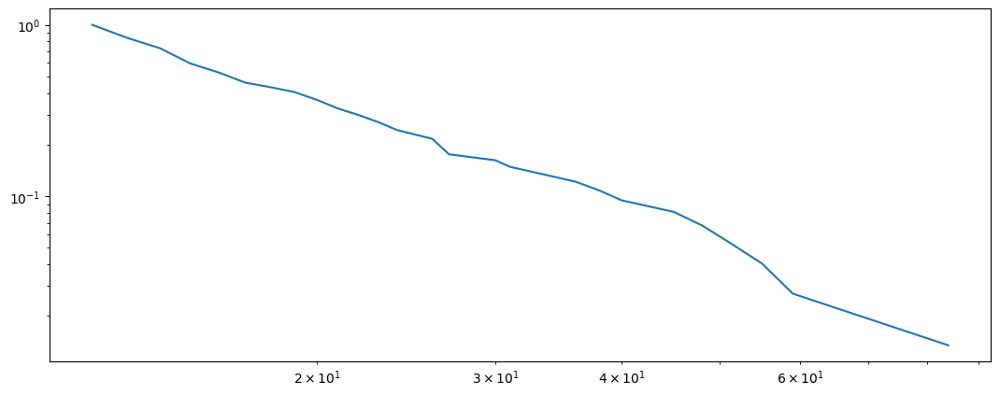

Comparison to lognormal
Log likelihood ratio: 0.0010713766343006803
p-value: 0.8237649422603686
Comparison to exponential
Log likelihood ratio: 7.14741420750146
p-value: 0.04520461628538414
Comparison to lognormal_positive
Log likelihood ratio: 0.6805558950676271
p-value: 0.4382964328607878
Comparison to stretched_exponential
Log likelihood ratio: 0.31505234624400824
p-value: 0.5750894897070332
Comparison to truncated_power_law
Log likelihood ratio: -0.04931656885017999
p-value: 0.7534761290136194


Assuming nested distributions


In [111]:
import powerlaw


plt.rcParams['figure.figsize'] = [13, 5]
comparisons = ["lognormal","exponential","lognormal_positive","stretched_exponential","truncated_power_law"]

for key, graph in g_dict.items():
  print(f"{'-'*len(key)} Graph => {key} {'-'*len(key)}\n")
  degrees = [degree for node, degree in graph.degree()]
  fit = powerlaw.Fit(degrees)

  plt.figure()
  fit.plot_ccdf()
  plt.show()
  for i in comparisons:
    print("Comparison to", i)
    R, p = fit.distribution_compare('power_law', i)
    print(f"Log likelihood ratio: {R}")
    print(f"p-value: {p}")


💬 :Possible resposta, si deixem el q hi ha ara

In order to know if the graph follows a powerlaw distribution, we have to compare its powerlaw distribution with the other types of distributions. In our case, we have compare it with all the different distribution that the "distribution_compare" function has, which are: lognormal, exponential, lognormal_positive, stretched_exponential, truncated_power_law. With that comparison, if our Log likelihood ratio is positive and our p-value is very low, it means that the powerlaw distribution is better than the one we have compared with. We can see that it is not the case that it fullfils the previous when comparing with all distributions, so we can conclude that eventhough the best distribution is not a powerlaw, it is true that it is better than some of them. So powerlaw is not the best distribution possible, but it could follow it.